# Exploration
- The interaction between independent variables and the target variable is explored using visualization and statistical testing
- Clustering is used to explore the data
    - Statistical testing and visualization is utilized to determine if the cluster is useful
    - A clear conclusion is drawn from the interactions
    - At least 3 combinations of features for clustering should be tried
    - The clusters should also be compared to the target variable

In [1]:
# imports
import wrangle as wr
import numpy as np
import pandas as pd

#vizualizations
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# acquire the wine dataframe
df = wr.wine_df()

In [3]:
# clean the data frame
df = wr.clean_wine(df)

In [4]:
# create num and cat columns: 
cat_cols, num_cols = wr.identify_columns(df)

In [5]:
# remove outliers: 
df = wr.remove_outliers(df, 3, num_cols)

### Univariate Data: 
- Target: Quality
- Numerical Data
- Categorical Data

Distribution of fixed_acidity
count    6158.000000
mean        7.112399
std         1.098513
min         3.800000
25%         6.400000
50%         6.900000
75%         7.600000
max        11.500000
Name: fixed_acidity, dtype: float64


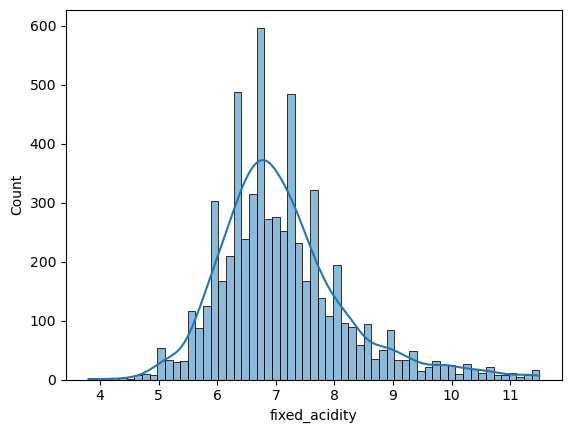

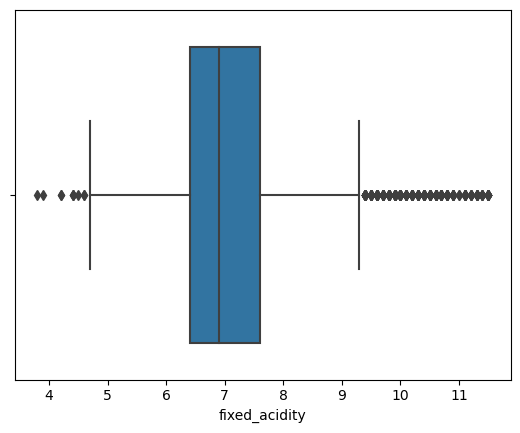

Distribution of volatile_acidity
count    6158.000000
mean        0.329796
std         0.151518
min         0.080000
25%         0.220000
50%         0.290000
75%         0.390000
max         0.905000
Name: volatile_acidity, dtype: float64


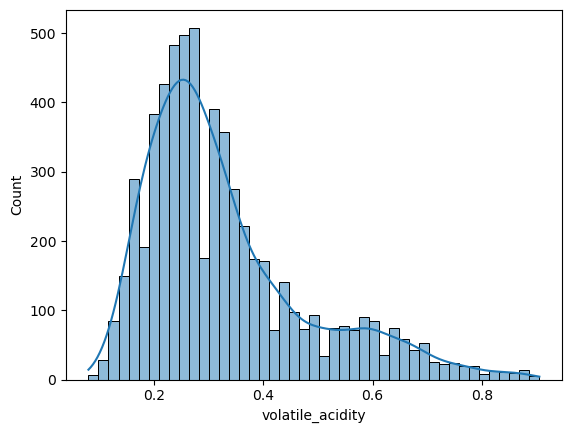

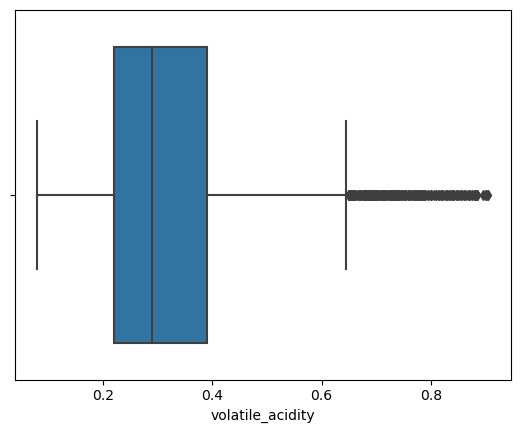

Distribution of citric_acid
count    6158.000000
mean        0.312254
std         0.135398
min         0.000000
25%         0.240000
50%         0.310000
75%         0.380000
max         0.800000
Name: citric_acid, dtype: float64


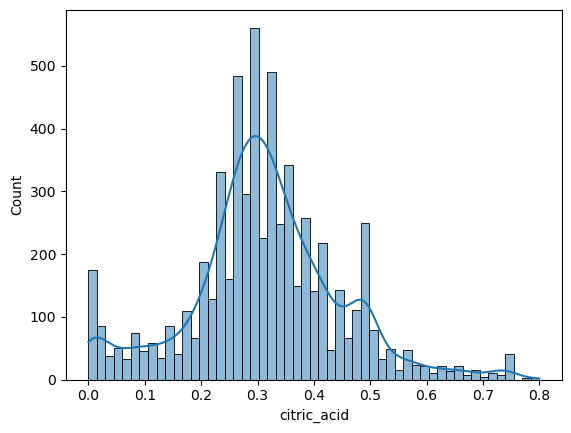

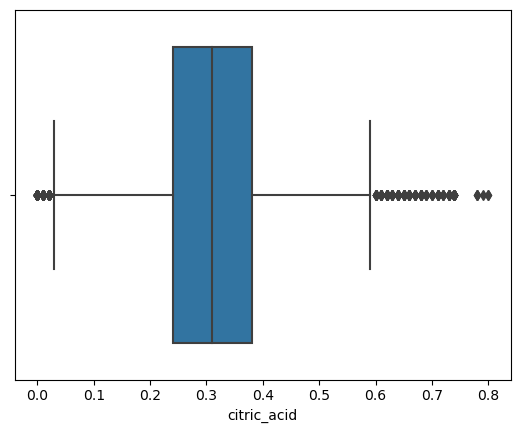

Distribution of residual_sugar
count    6158.000000
mean        5.536781
std         4.720489
min         0.600000
25%         1.800000
50%         3.200000
75%         8.300000
max        26.050000
Name: residual_sugar, dtype: float64


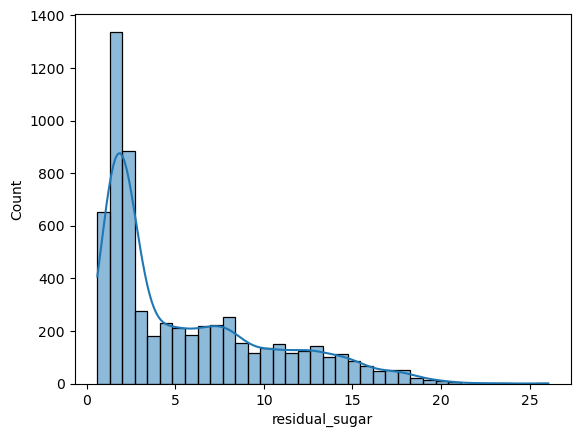

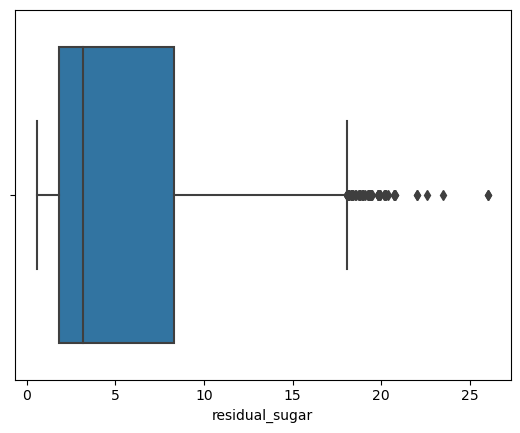

Distribution of chlorides
count    6158.000000
mean        0.051477
std         0.020138
min         0.009000
25%         0.037000
50%         0.046000
75%         0.060000
max         0.133000
Name: chlorides, dtype: float64


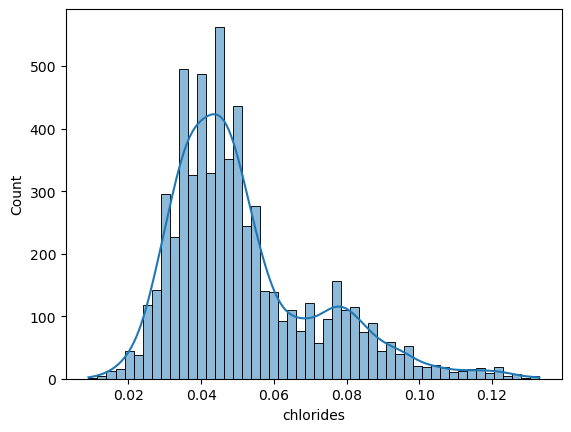

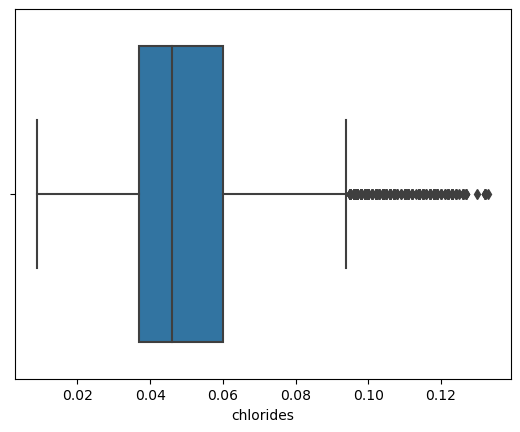

Distribution of free_sulfur_dioxide
count    6158.000000
mean       30.848003
std        16.992480
min         1.000000
25%        18.000000
50%        29.000000
75%        42.000000
max       112.000000
Name: free_sulfur_dioxide, dtype: float64


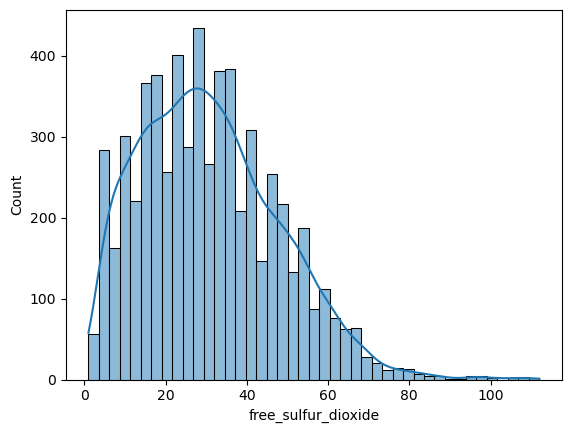

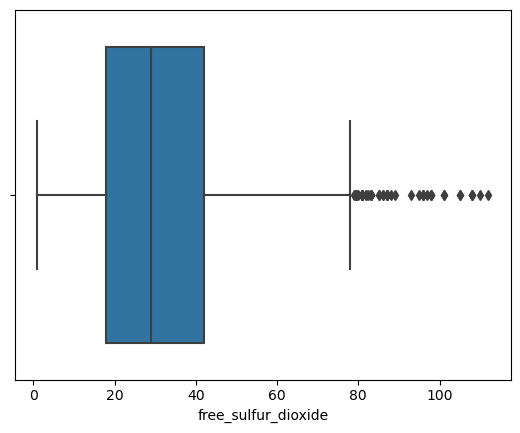

Distribution of total_sulfur_dioxide
count    6158.000000
mean      117.682933
std        55.279127
min         6.000000
25%        83.000000
50%       120.000000
75%       156.000000
max       366.500000
Name: total_sulfur_dioxide, dtype: float64


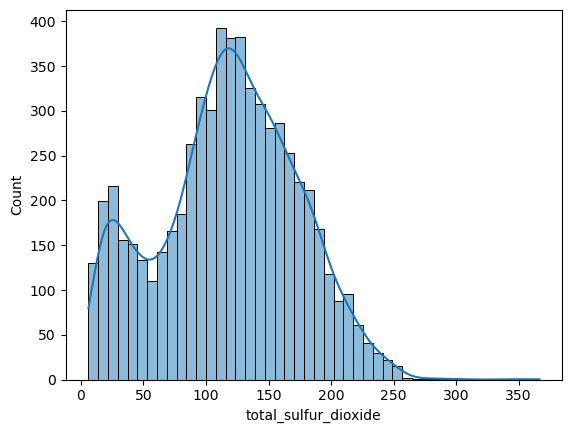

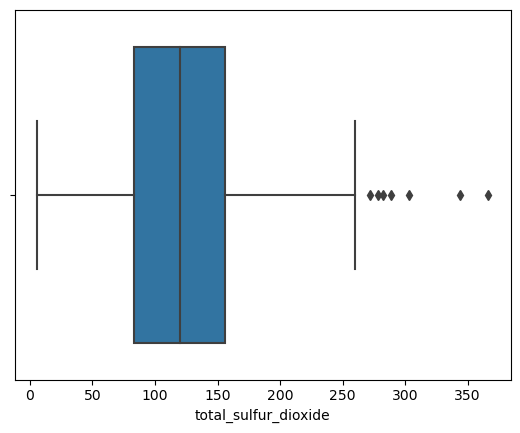

Distribution of density
count    6158.000000
mean        0.994557
std         0.002889
min         0.987110
25%         0.992200
50%         0.994775
75%         0.996800
max         1.002950
Name: density, dtype: float64


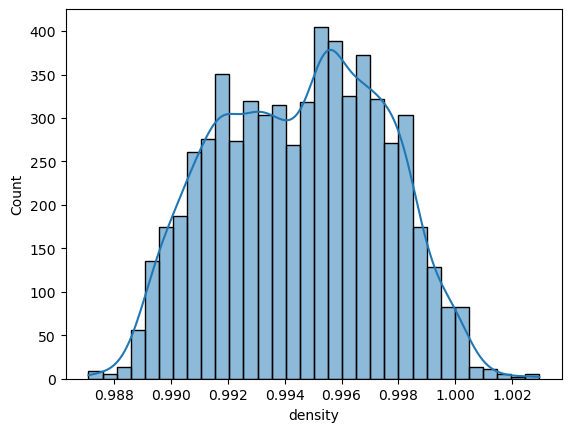

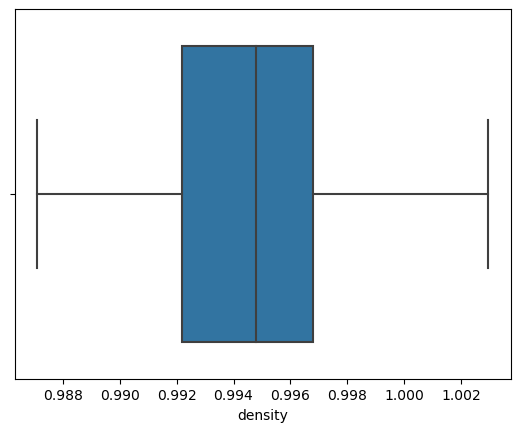

Distribution of pH
count    6158.000000
mean        3.220663
std         0.159407
min         2.720000
25%         3.110000
50%         3.210000
75%         3.320000
max         3.900000
Name: pH, dtype: float64


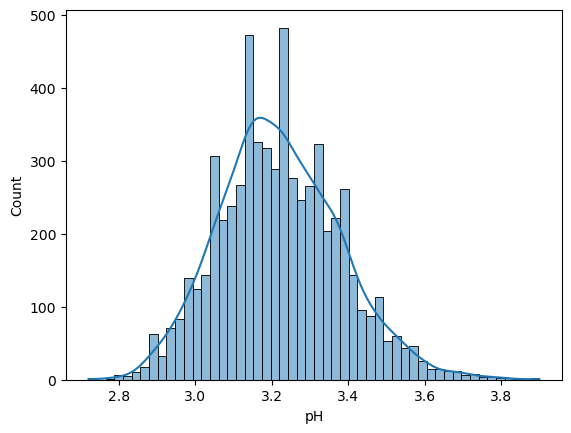

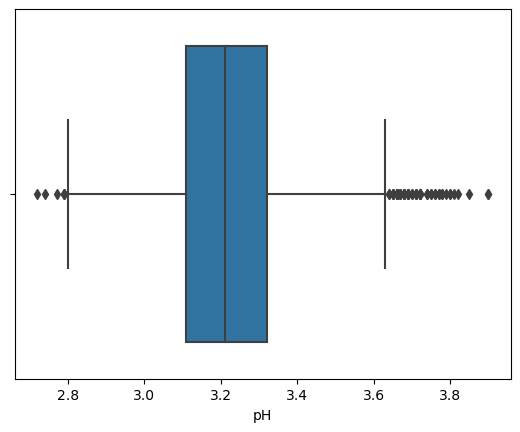

Distribution of sulphates
count    6158.000000
mean        0.522467
std         0.131117
min         0.220000
25%         0.430000
50%         0.500000
75%         0.590000
max         1.060000
Name: sulphates, dtype: float64


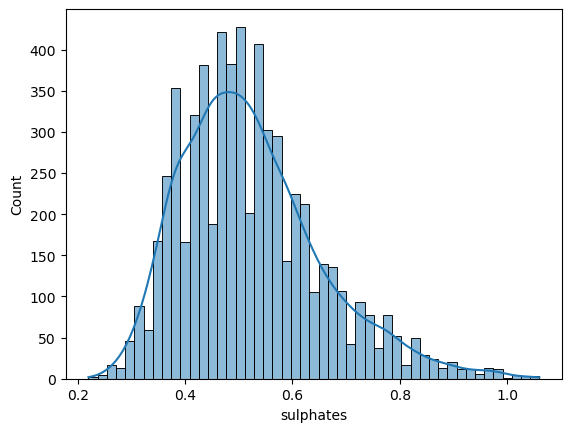

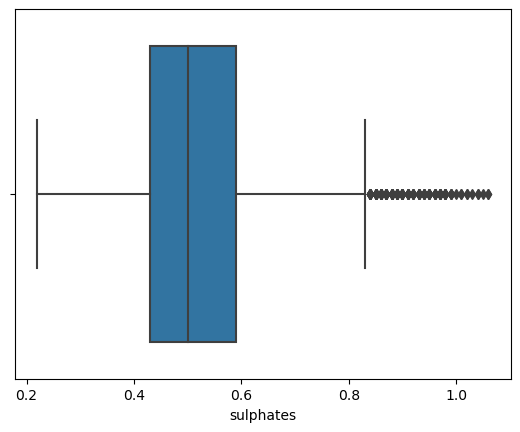

Distribution of alcohol
count    6158.000000
mean       10.514081
std         1.198329
min         8.000000
25%         9.500000
50%        10.400000
75%        11.300000
max        14.200000
Name: alcohol, dtype: float64


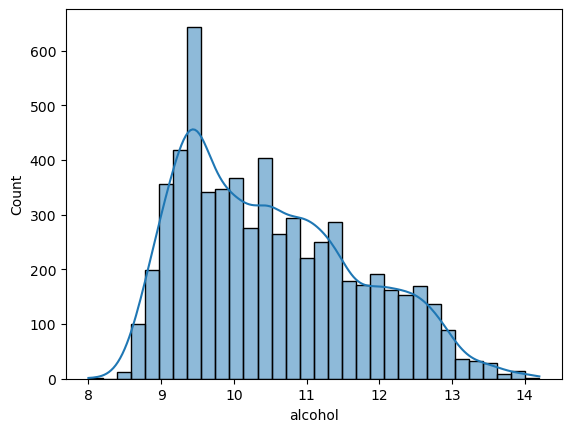

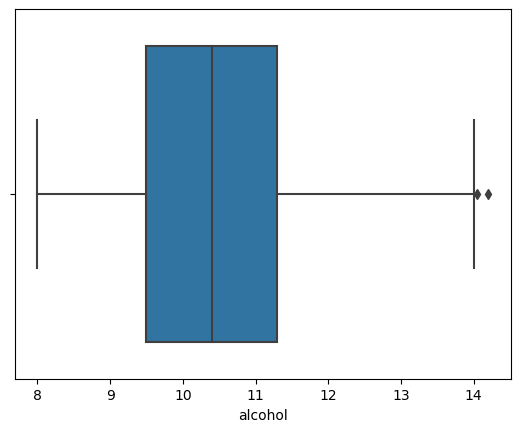

In [6]:
# Quantitative first:
for col in num_cols:
    # print out the title:
    print (f'Distribution of {col}')
    # show descriptive statistics
    print(df[col].describe())
    # first graph is a histogram: 
    sns.histplot(data=df, x = col, kde=True)
    plt.show()
    # second graph is boxplot
    #plt.boxplot(train[col])
    #plt.show()
    sns.boxplot(data=df, x = col)
    plt.show()
    print('=======================')

Frequncy of quality
count    6158.000000
mean        5.840695
std         0.864615
min         3.000000
25%         5.000000
50%         6.000000
75%         6.000000
max         9.000000
Name: quality, dtype: float64
6    2707
5    2001
7    1049
8     191
4     189
3      16
9       5
Name: quality, dtype: int64


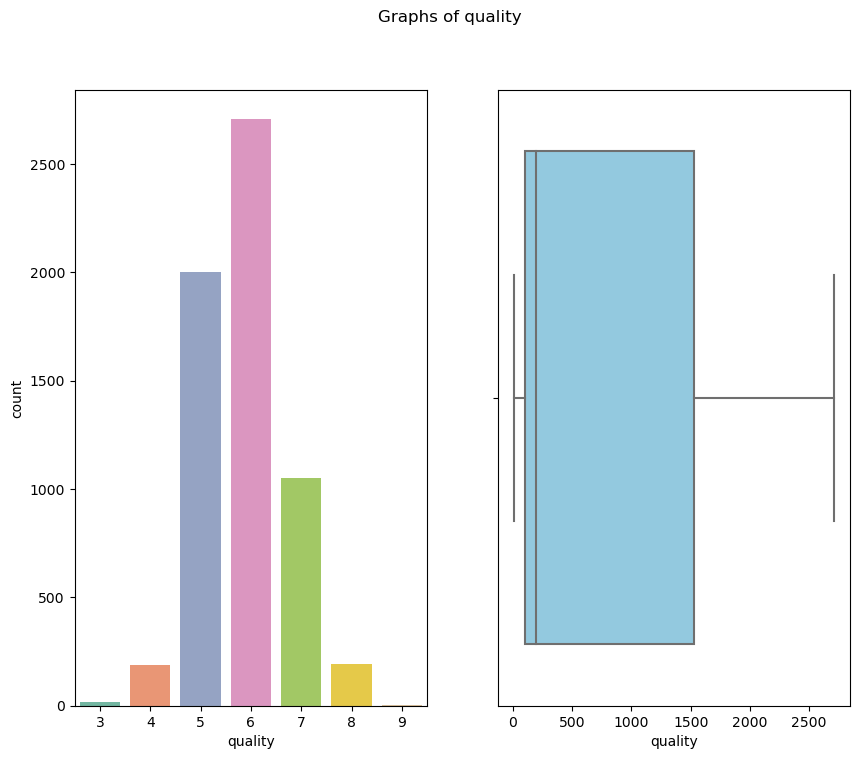

----------###---------
Frequncy of wine_color
count      6158
unique        2
top       white
freq       4794
Name: wine_color, dtype: object
white    4794
red      1364
Name: wine_color, dtype: int64


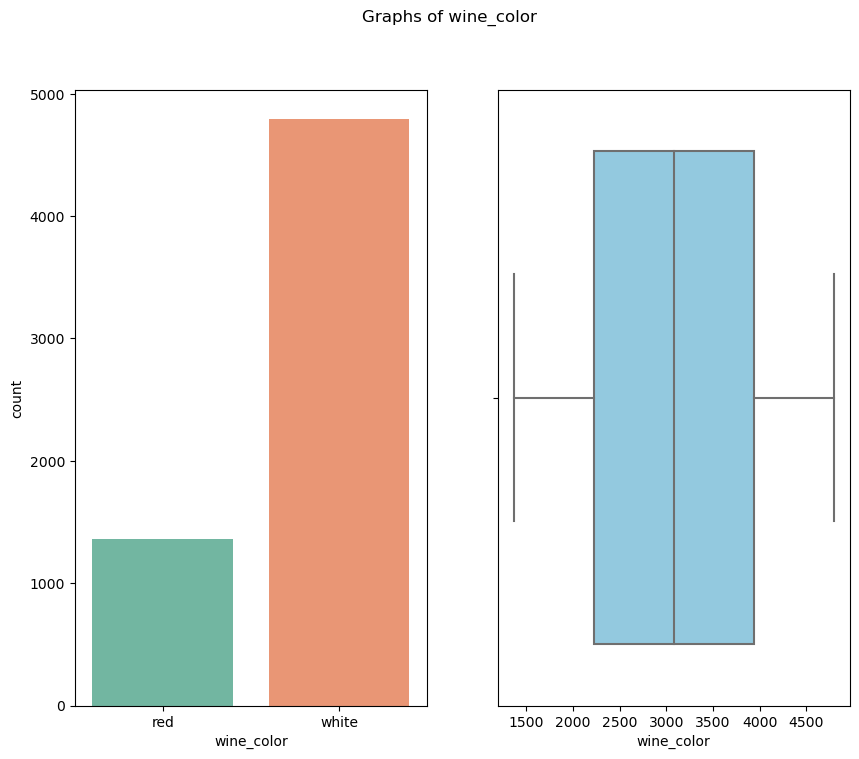

----------###---------


In [7]:
# look at all the categorical features
for col in cat_cols:
    print(f'Frequncy of {col}')
    print(df[col].describe())
    print(df[col].value_counts())
    
    #since there are multiple columns i want them to display side by side
    fig, ax = plt.subplots(1,2, figsize=(10,8))
    fig.suptitle(f'Graphs of {col}')
    
    #plot one: 
    sns.countplot(data = df, x = col, ax=ax[0], palette = 'Set2')
    
    #plot two:
    sns.boxplot(ax=ax[1], data = df, x = df[col].value_counts(), color = 'skyblue')

   
    plt.show()
    print('----------###---------')
    

### Takeaways (numerical): 
- Fixed acidity: Looks nomrmal.  <br>
| min: 3.8 | mean: 7.11 | max: 11 |
- volatile acidity: Positive Skew. <br>
| min: 0.08 | mean: 0.33 | max: 0.91 |
- citric acidity: Positive skew (slight) <br>
| min: 0.0 | mean : 0.3115 | max : 0.8 |
- residual sugar: Positive skew <br>
| min: 0.6 | mean : 5.37 | max: 26.05 |
- chlorides: Positive Skew <br>
| min: 0.009 | mean: 0.05 | max: 0.113 |
- free sulfur dioxide: Positive skew <br>
| min: 1.0 | mean: 30.84 | max: 112.0 |
- total sulfur dioxide: Positive skew <br>
| min: 6.0 | mean: 117.68 | max: 366.5 |
- density: Normal <br>
| min: 0.98 | mean: 0.994 | max: 1.0029 |
- pH: Normal <br>
| min: 2.72 | mean: 3.22 | max: 3.90 |
- sulphate: positive skew <br>
| min: 0.22 | mean: 0.52 | max: 1.06 |
- alcohol: positive skew <br>
| min: 8.0 | mean: 10.51 | max: 14.20 |

### Takeways (categorical):
- Quality: Nothing lower than 3, most of the quality scores are around 6. Max review is 9.
- Wine color is majority red.

#### Background knowdlege ( based on paper ) 
- Increase in alchohol leads to better quality wine
- In white wine: cirtirc acid ad resdiual sugars are more improtant
- Suplhats are very important - might be related to the fermenting nutrition, which is very important to imporce wine armoa. 
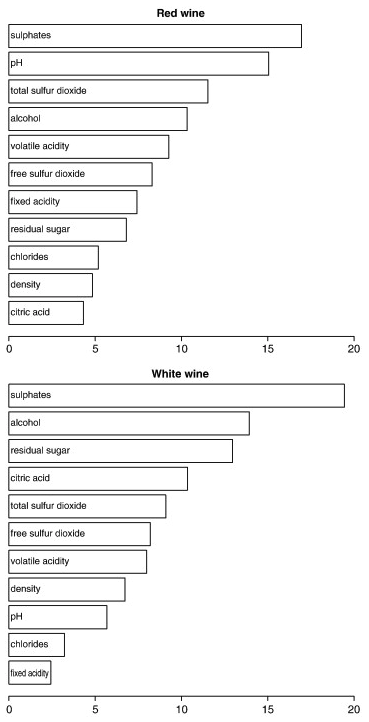

## Bivariate: 

In [8]:
# imports 
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings("ignore")

In [9]:
# need to split the data: 
def train_validate_test_split(df, target, seed=123):
    '''
    This function takes in a dataframe and splits the data into train, validate and test. 
    '''
    train_validate, test = train_test_split(df, test_size=0.2, random_state=seed)
    
    train, validate = train_test_split(train_validate, test_size=0.3, random_state=seed)
    return train, validate, test

In [10]:
target = 'quality'
train, validate, test = train_validate_test_split(df, target)

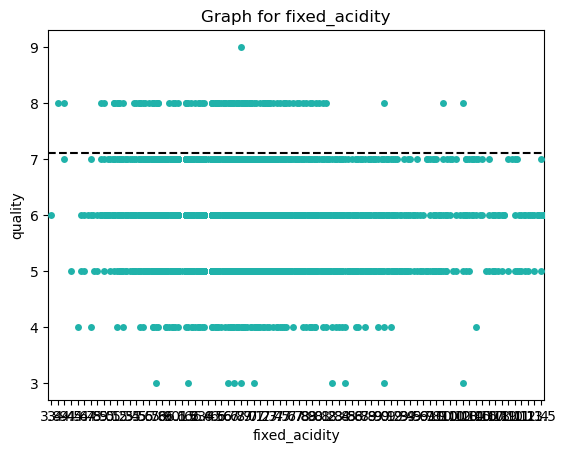

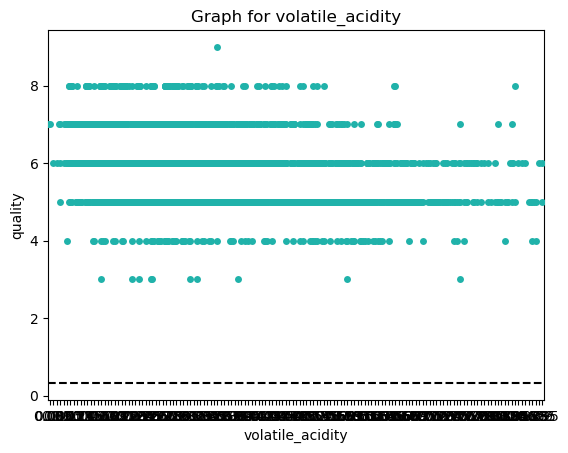

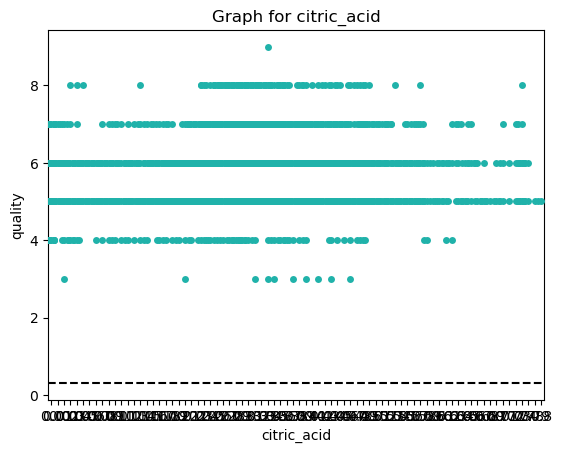

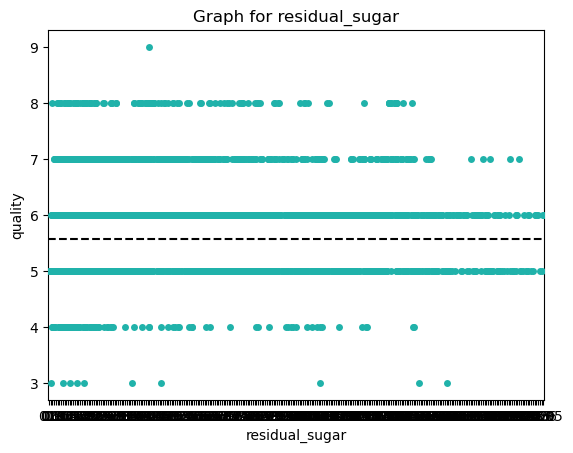

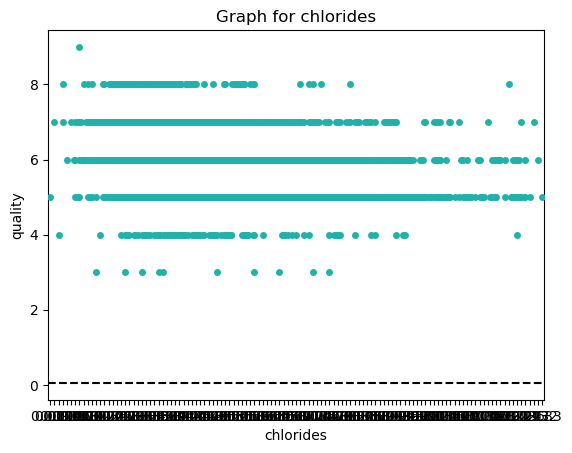

...

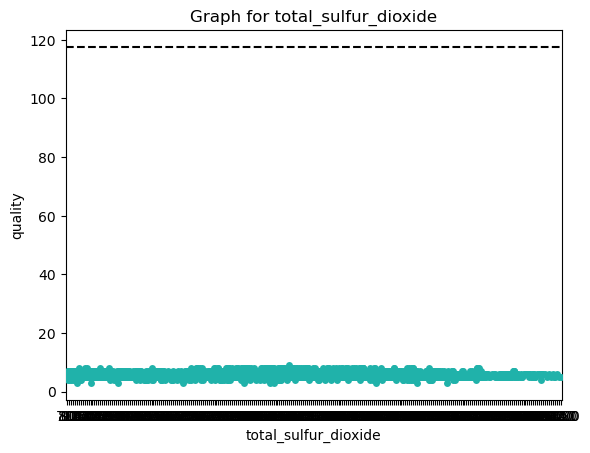

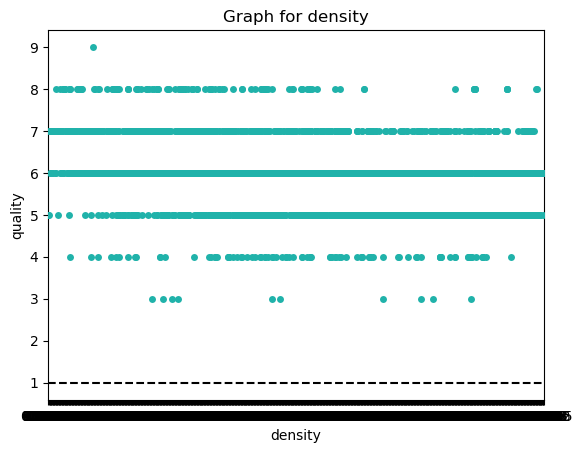

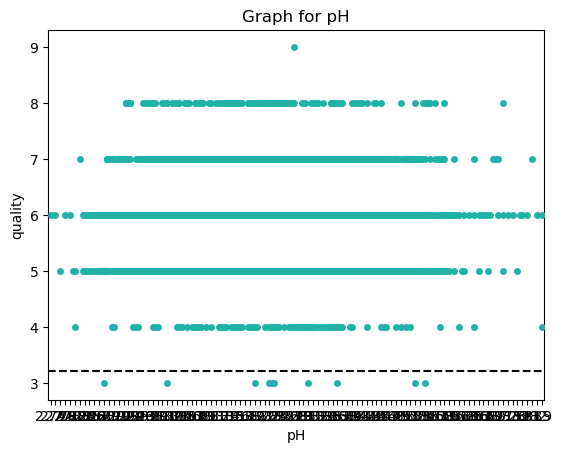

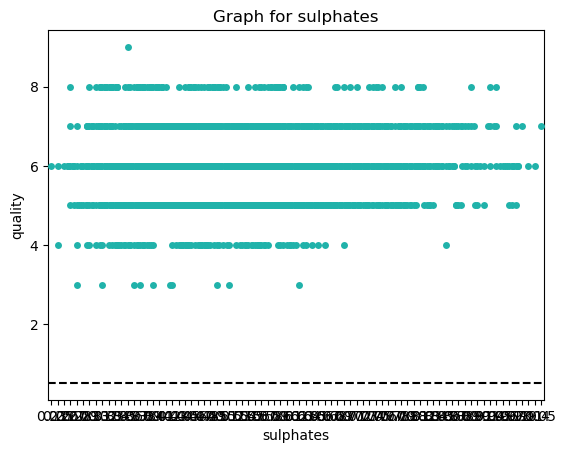

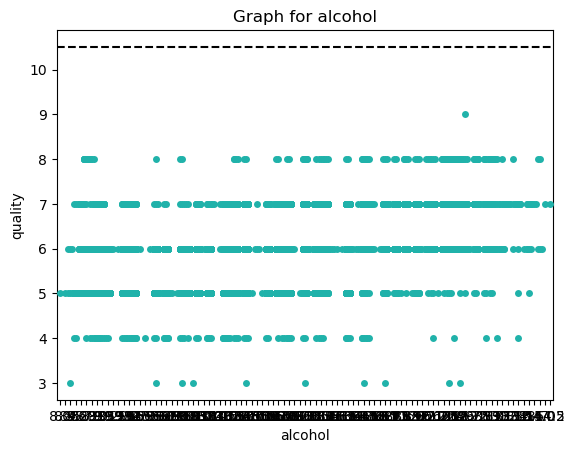

In [11]:
# swarm plot:
for col in num_cols:
    # create the plot:
    sns.swarmplot(data = train, x = col, y = target, color = 'lightseagreen')
    plt.title(f'Graph for {col}')
    average = train[col].mean()
    plt.axhline(average, ls = '--', color = 'black')
    plt.show()
    

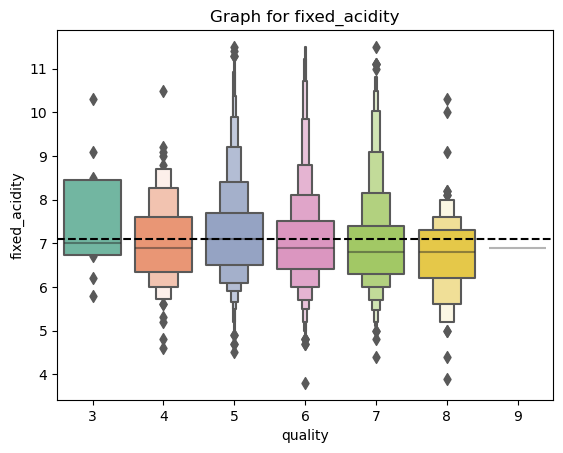

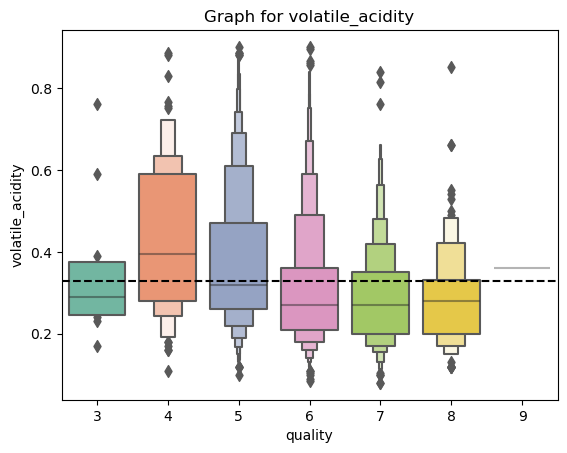

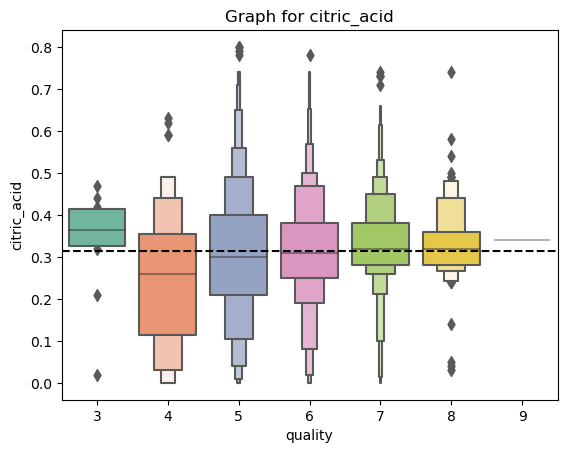

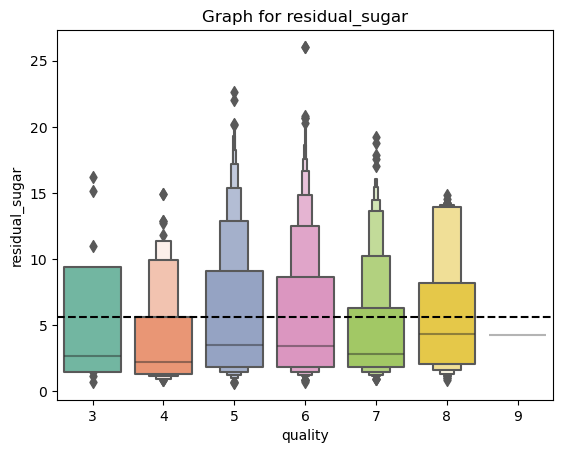

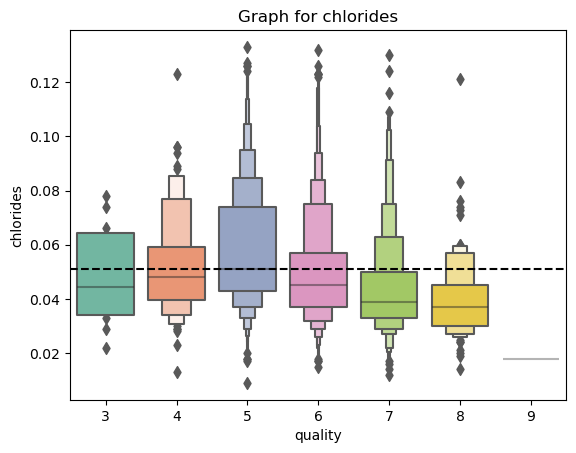

...

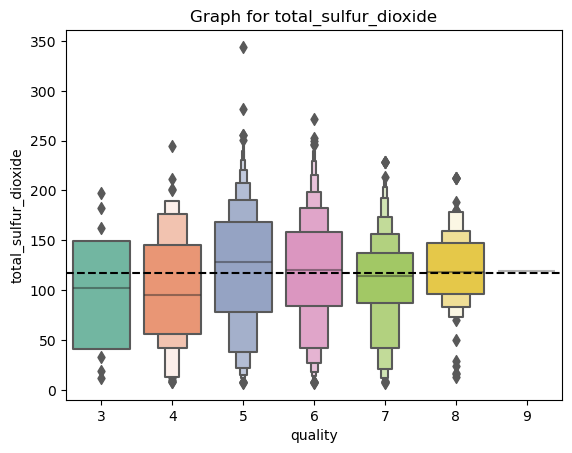

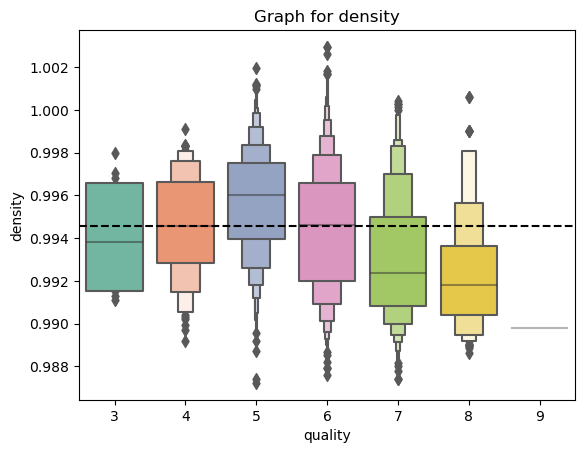

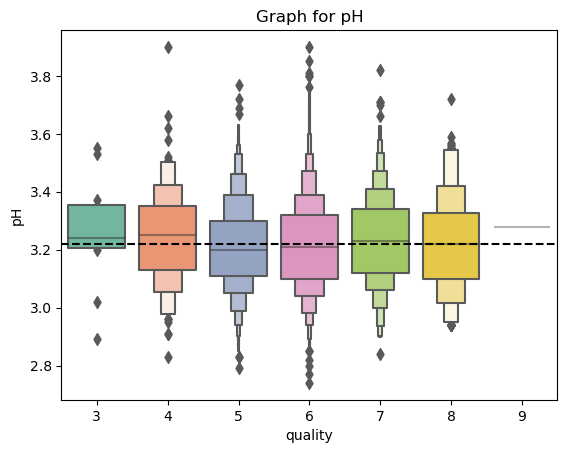

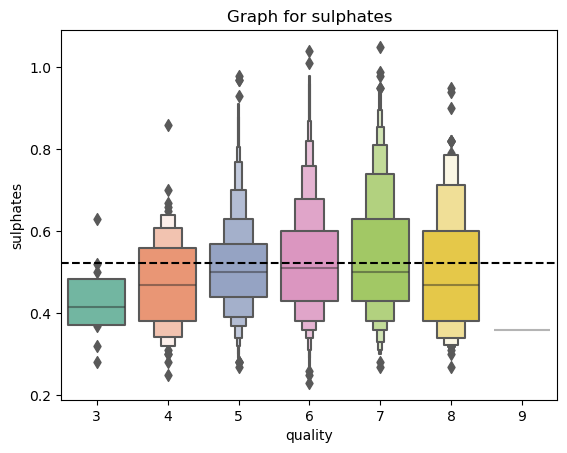

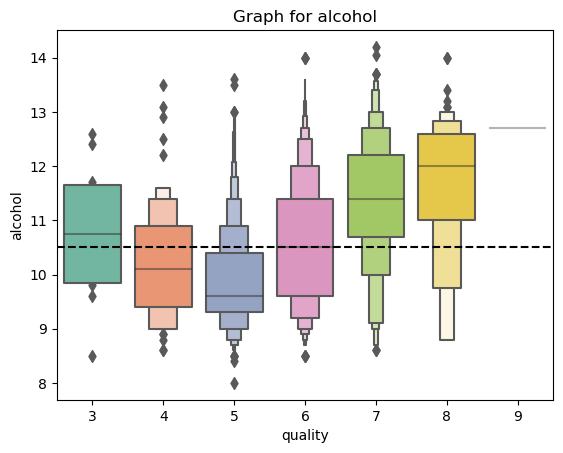

In [12]:
# boxen graph with average mean:
for col in num_cols:
    # create the plot:
    sns.boxenplot(data = train, x = target, y = col, palette = 'Set2')
    plt.title(f'Graph for {col}')
    average = train[col].mean()
    plt.axhline(average, ls = '--', color = 'black')
    plt.show()

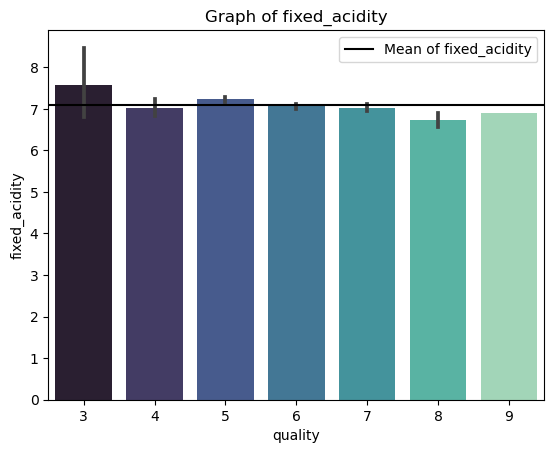

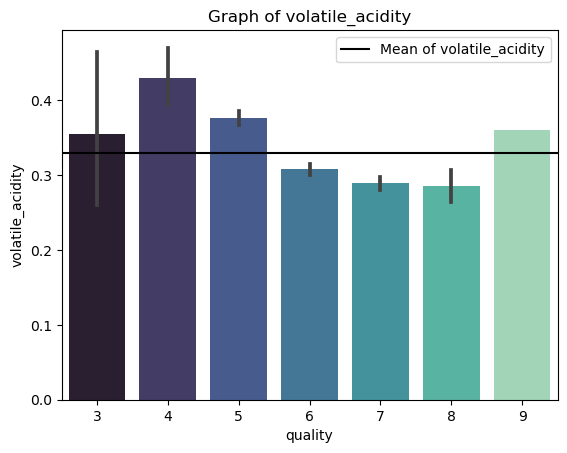

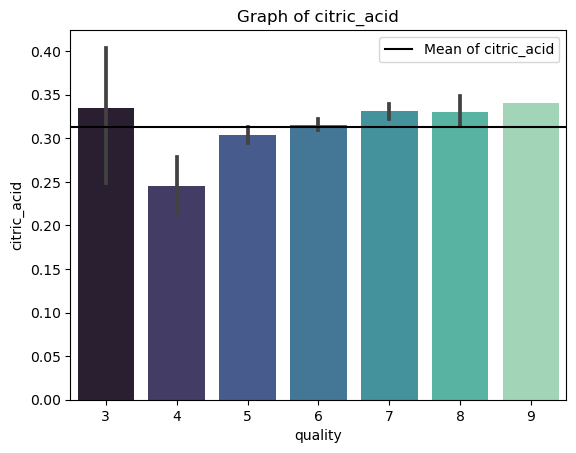

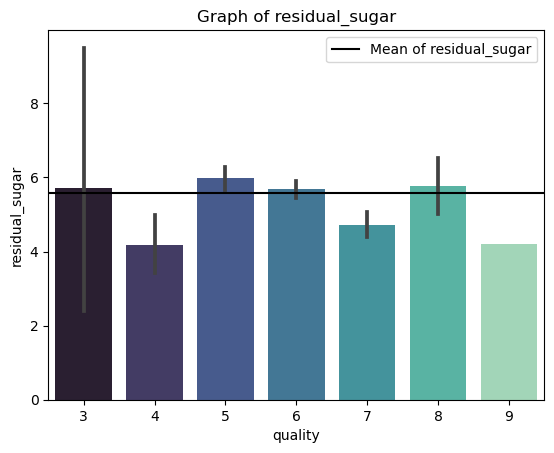

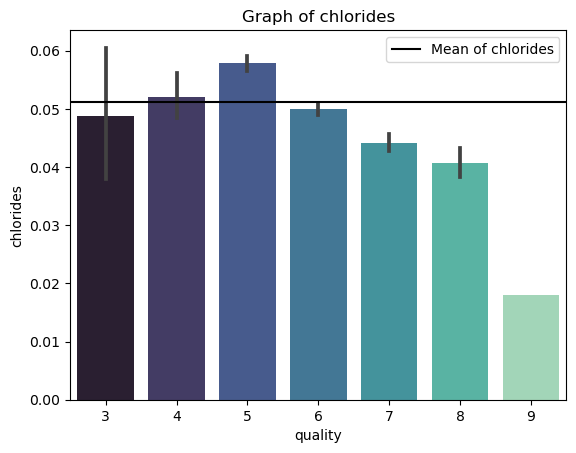

...

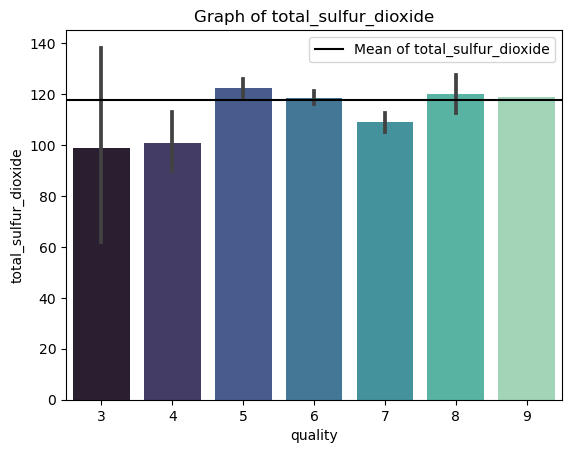

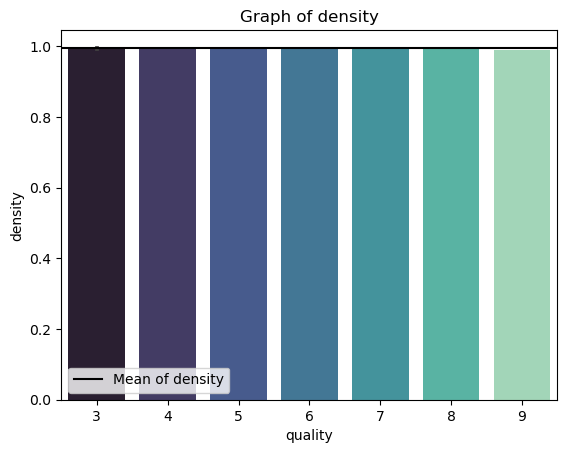

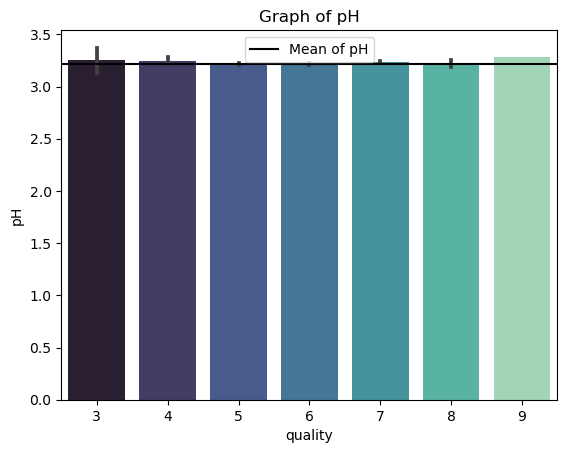

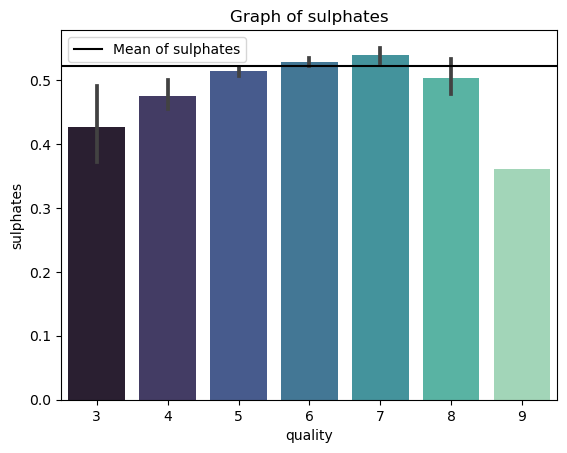

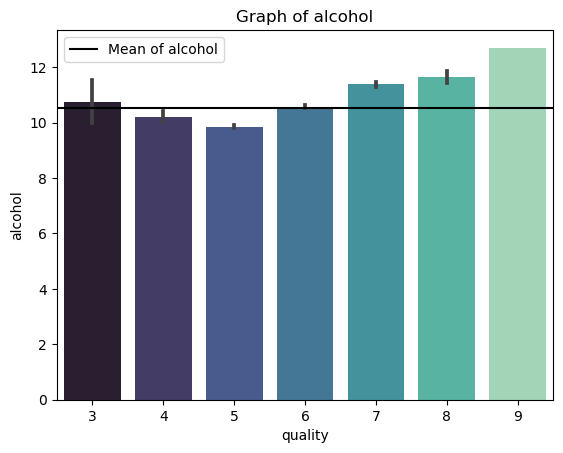

In [13]:
# bar plot
for col in num_cols:
    plt.title(f'Graph of {col}')
    sns.barplot(x = target, y = col, data = train, palette = 'mako')
    col_mean = train[col].mean()
    plt.axhline(col_mean, label = (f'Mean of {col}'), color = 'black')
    plt.legend()
    
    plt.show()

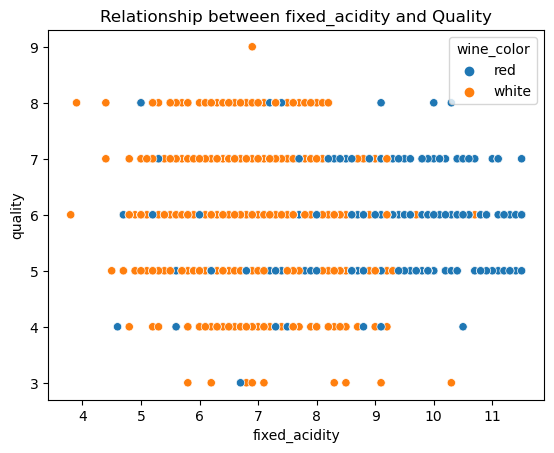

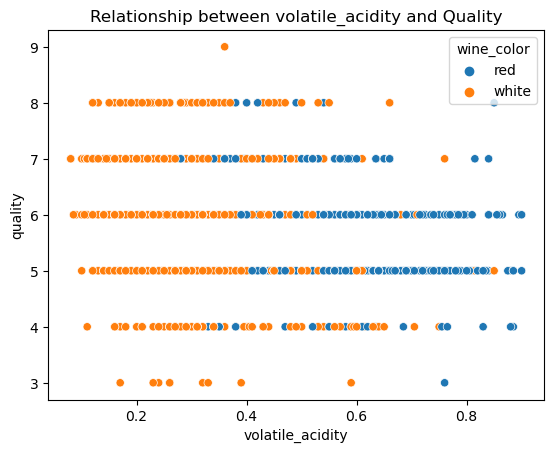

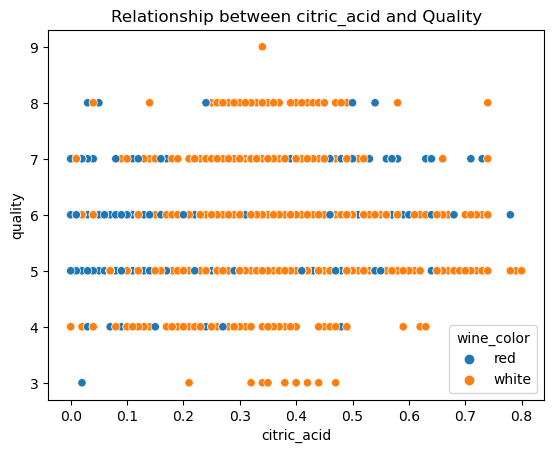

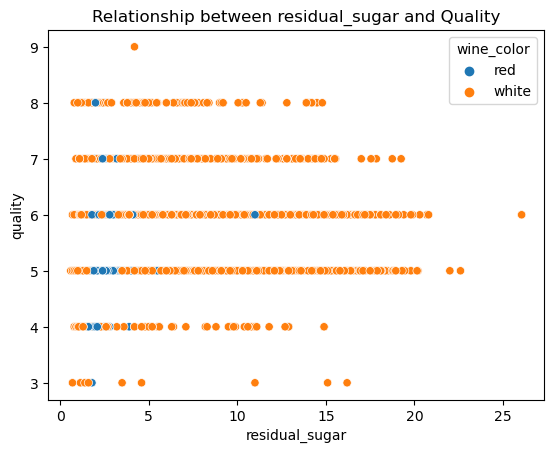

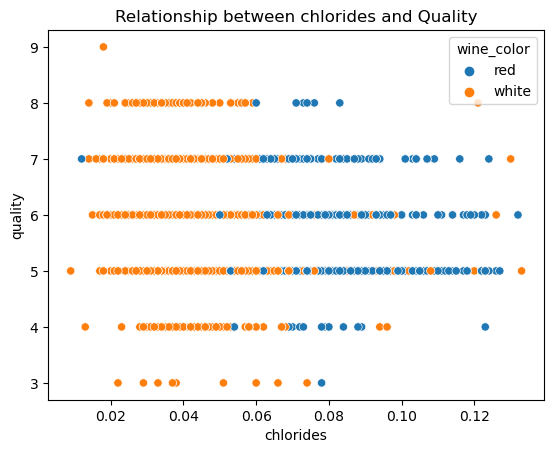

...

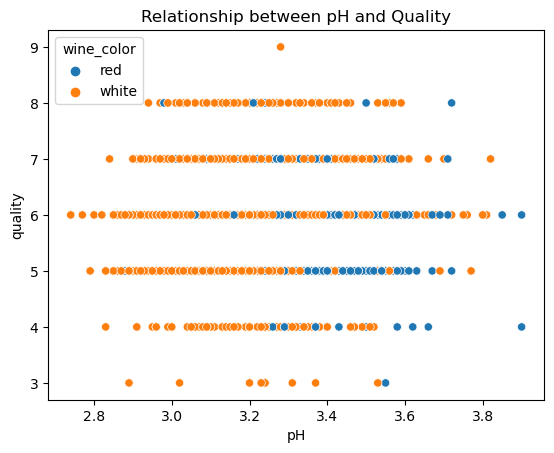

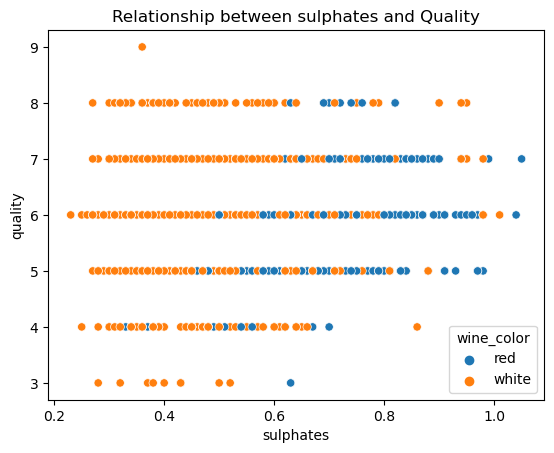

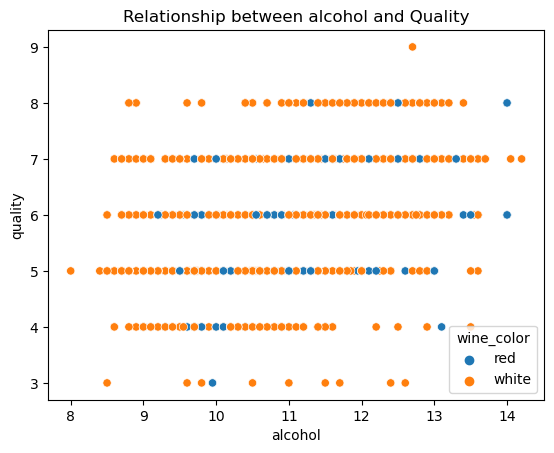

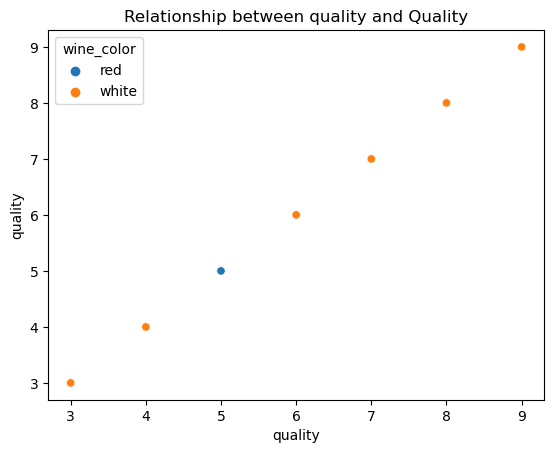

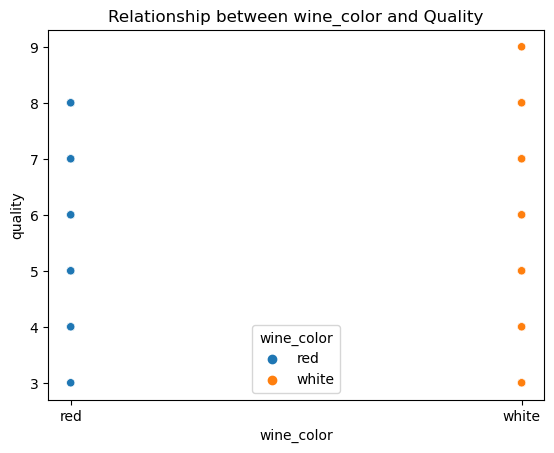

In [14]:
for col in train.columns: 
    sns.scatterplot(data = train, x = col, y = target, hue = 'wine_color')
    plt.title(f'Relationship between {col} and Quality')
    plt.show()
    print('========================')

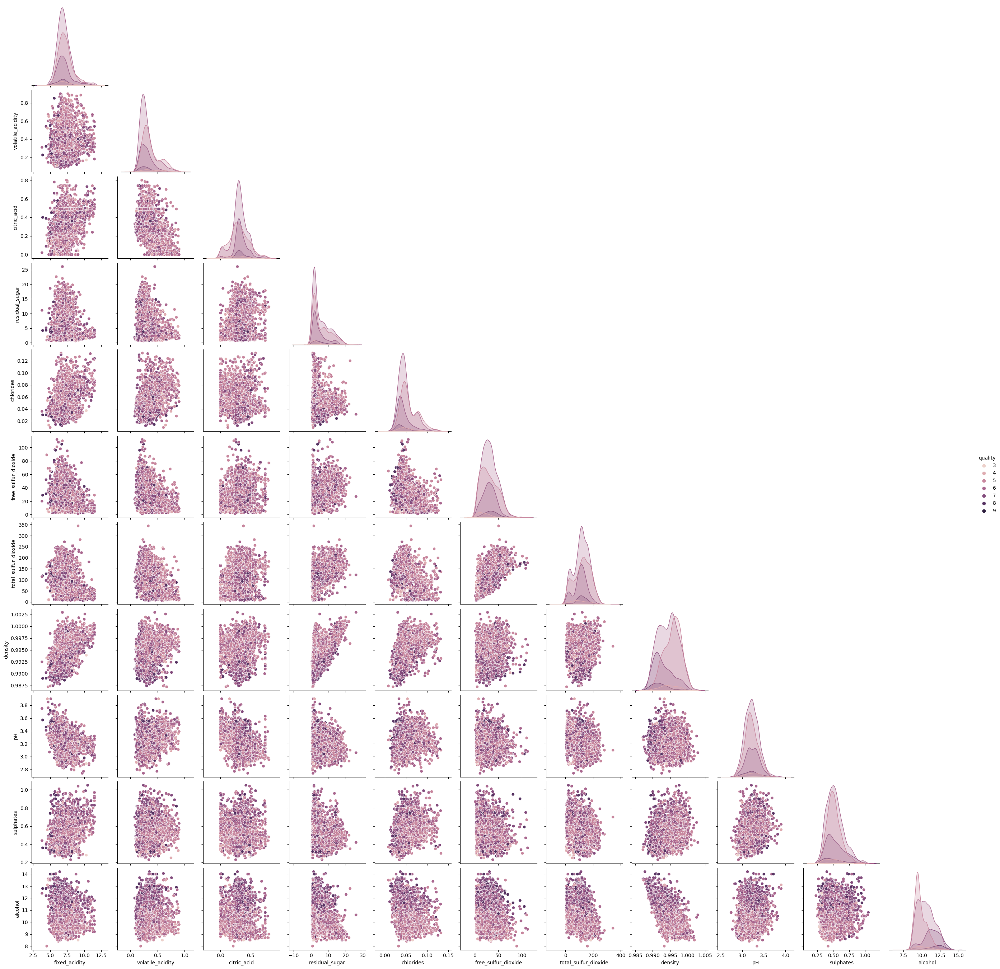

In [15]:
sns.pairplot(train, hue = 'quality', corner = True)
plt.show()

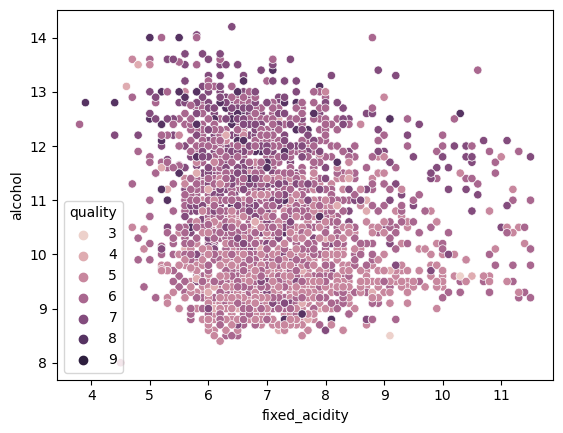

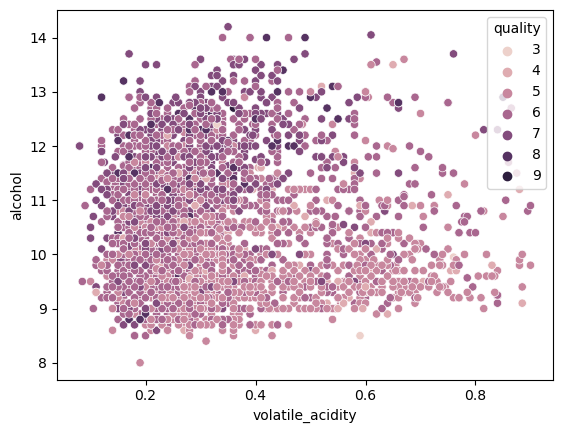

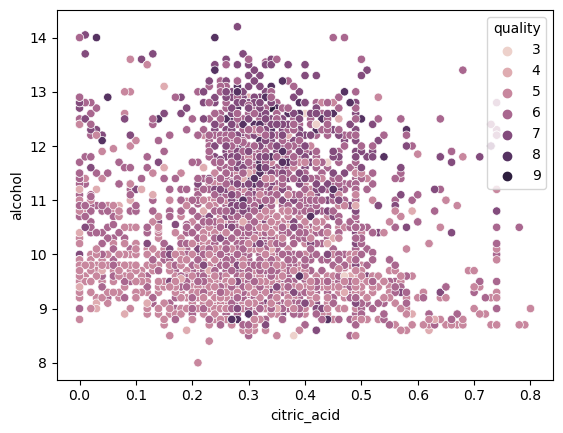

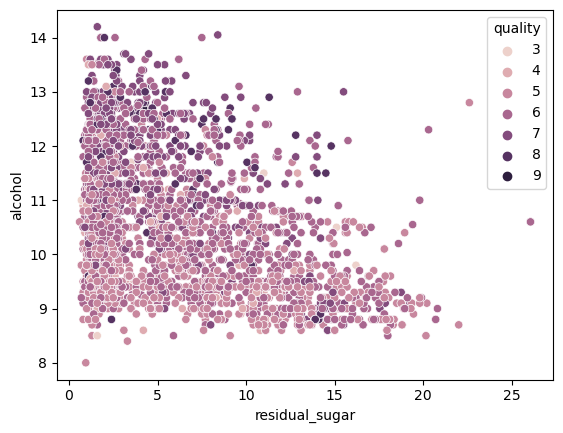

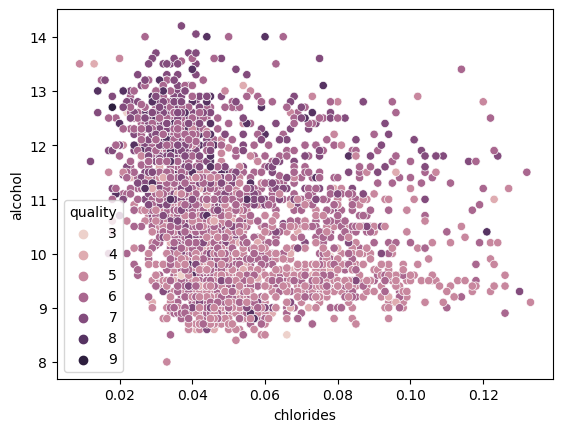

...

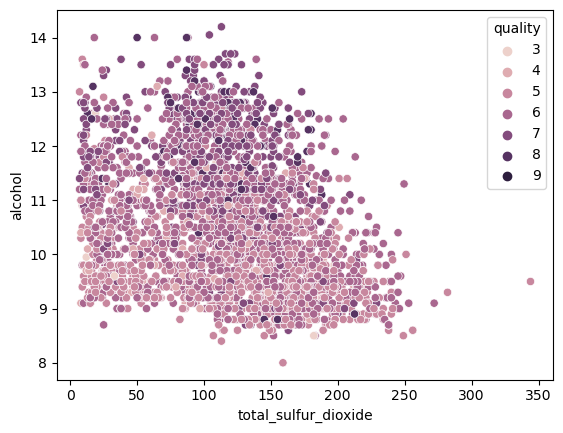

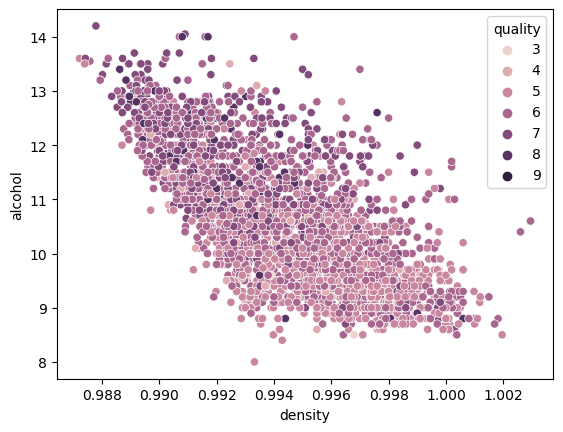

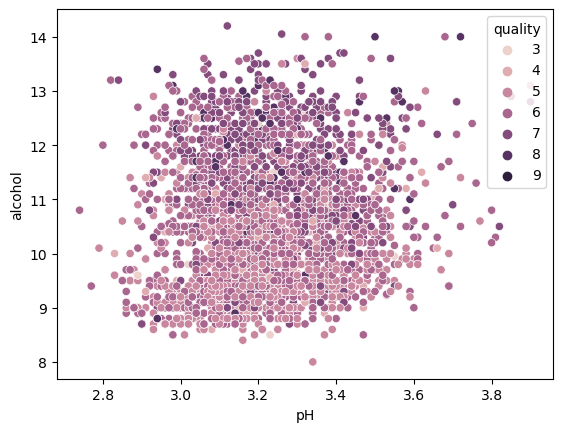

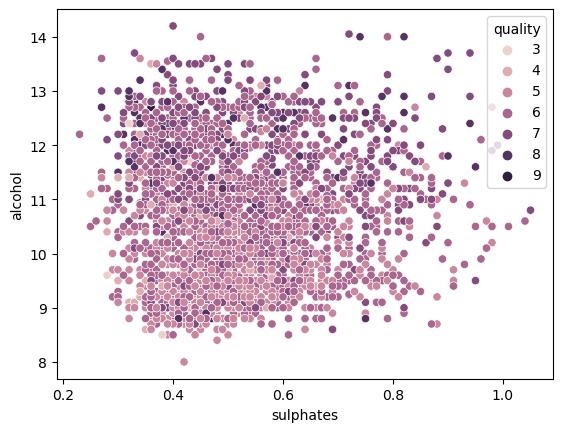

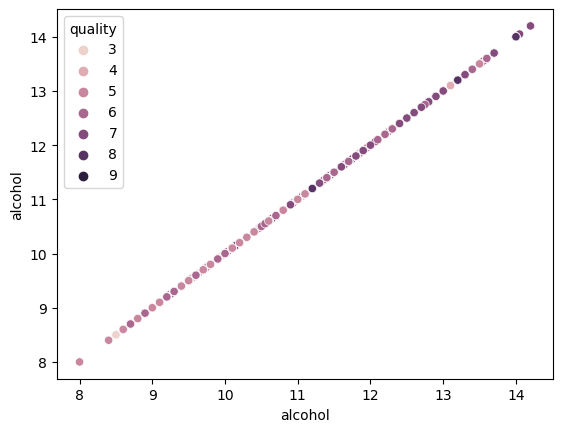

In [17]:
# I want to look at alcohol only
for col in num_cols:
    sns.scatterplot(x = col, y = 'alcohol', data = train, hue = target)
    plt.show()

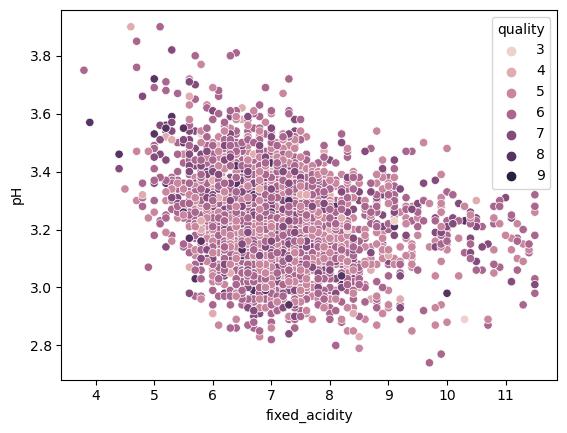

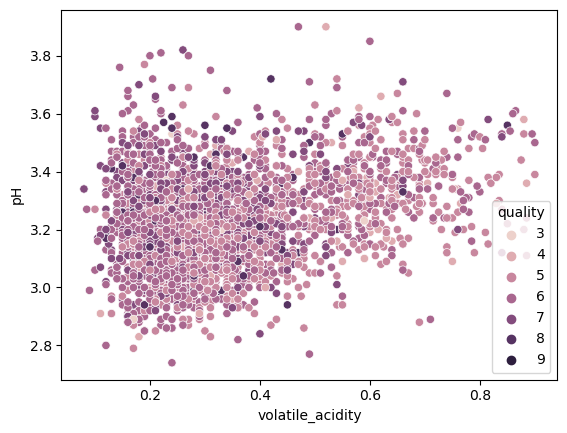

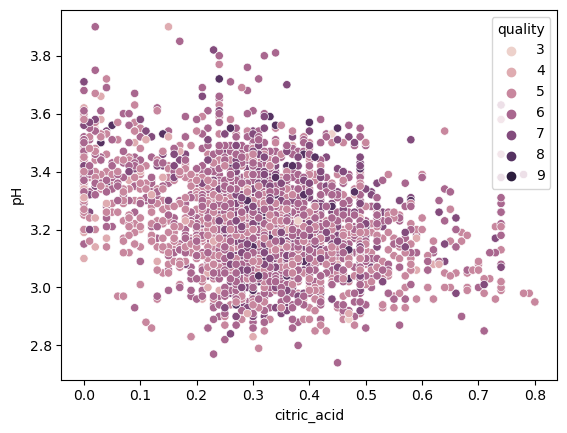

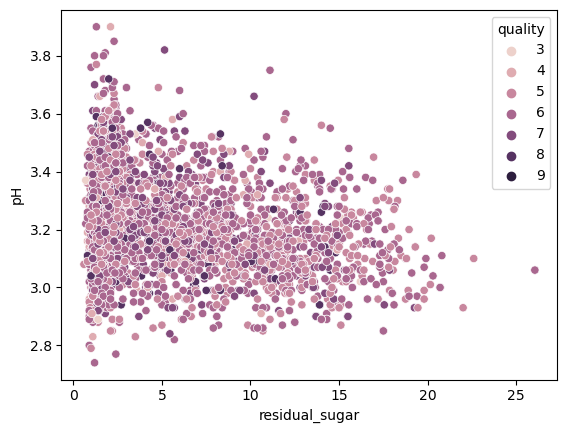

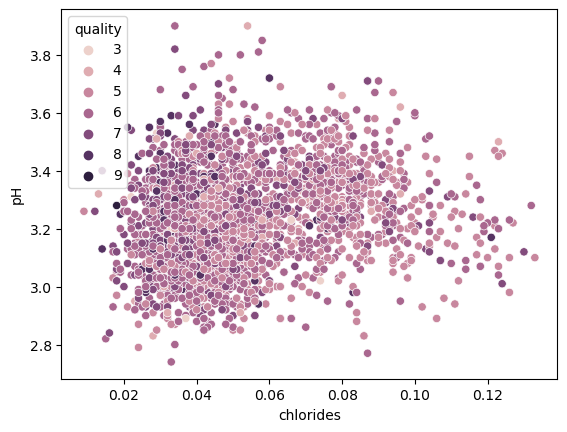

...

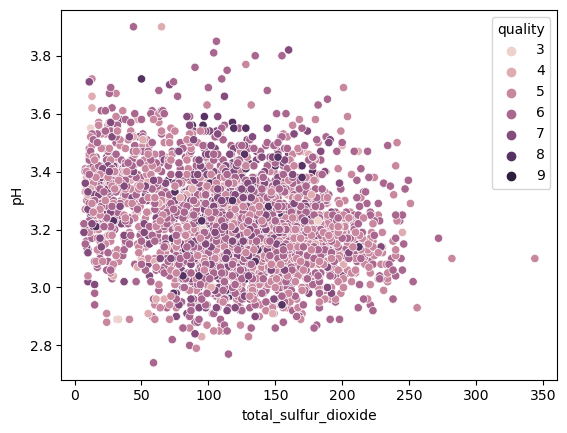

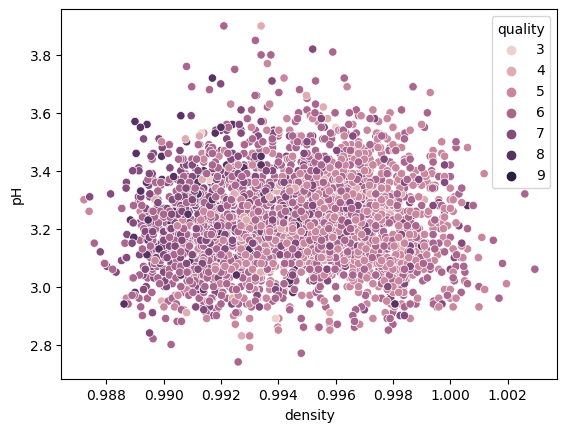

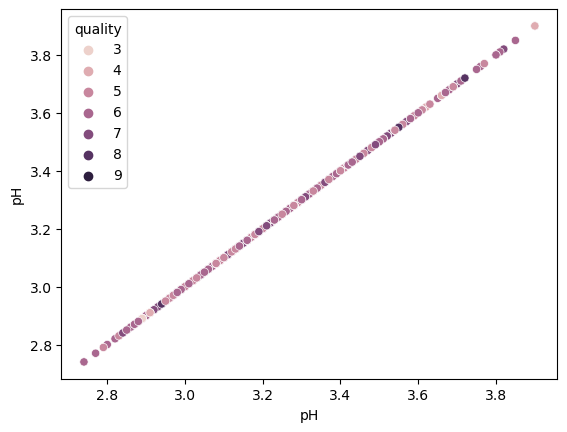

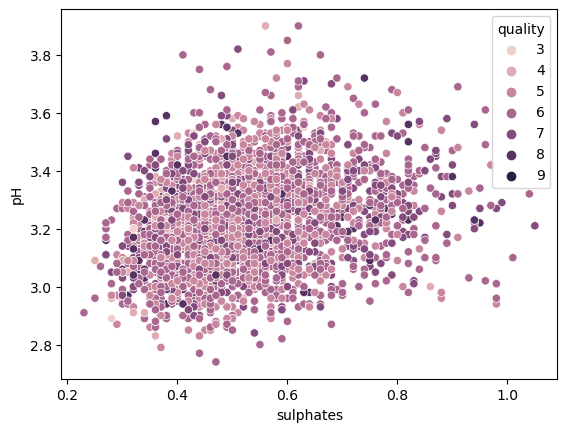

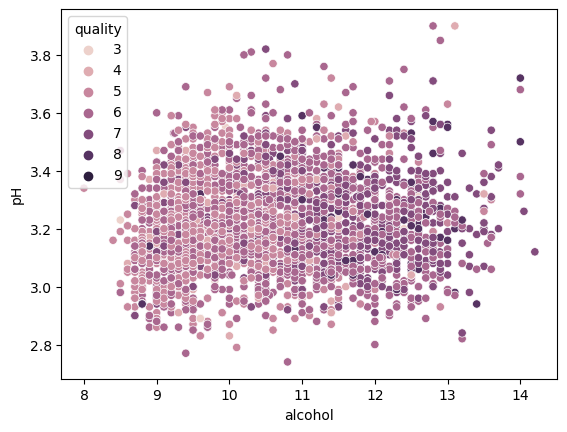

In [18]:
# just pH
for col in num_cols:
    sns.scatterplot(x = col, y = 'pH', data = train, hue = target)
    plt.show()

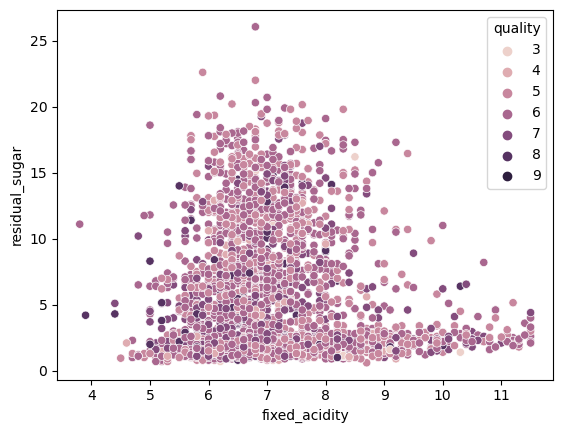

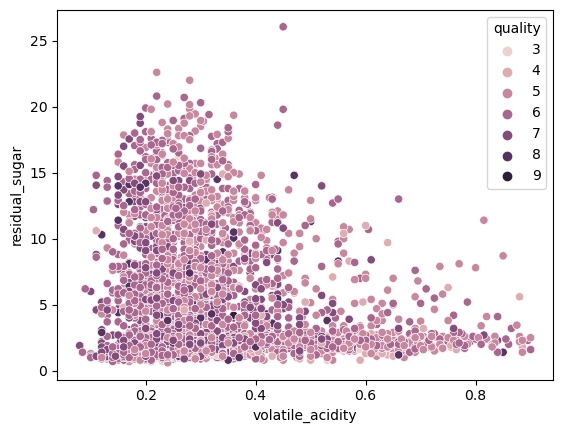

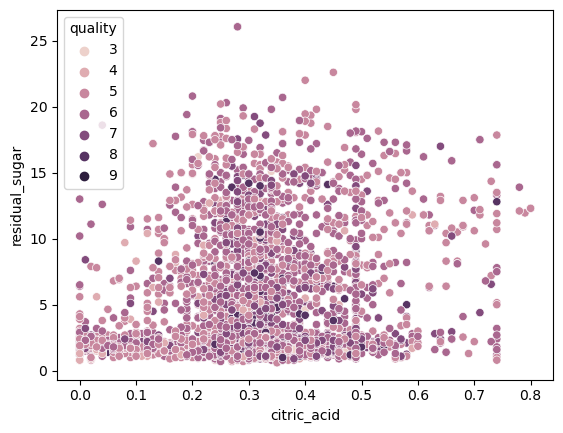

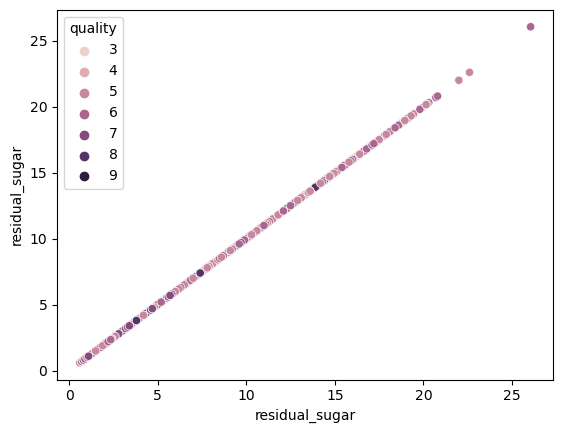

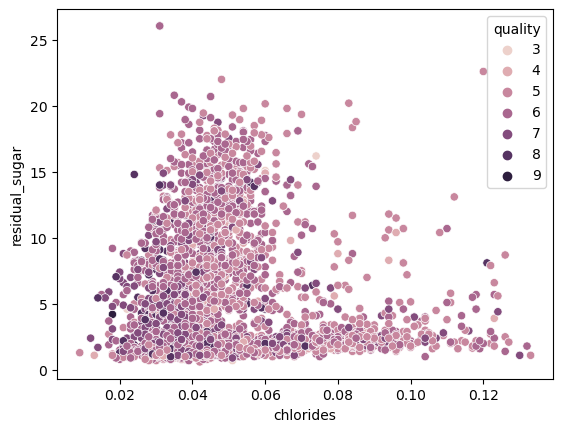

...

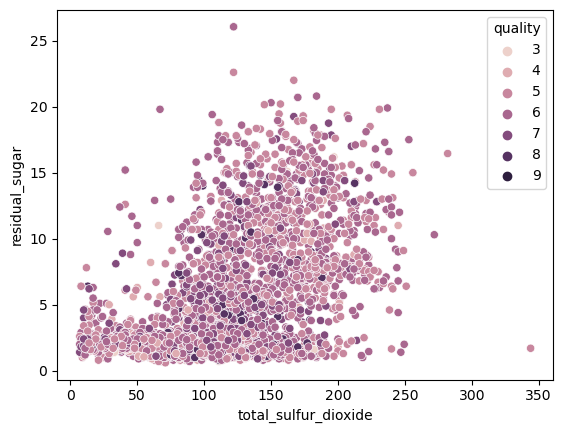

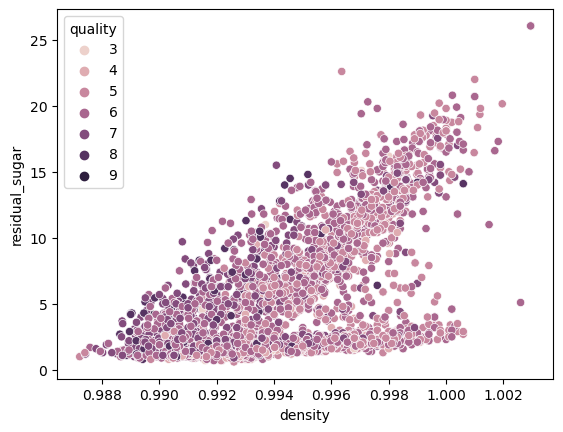

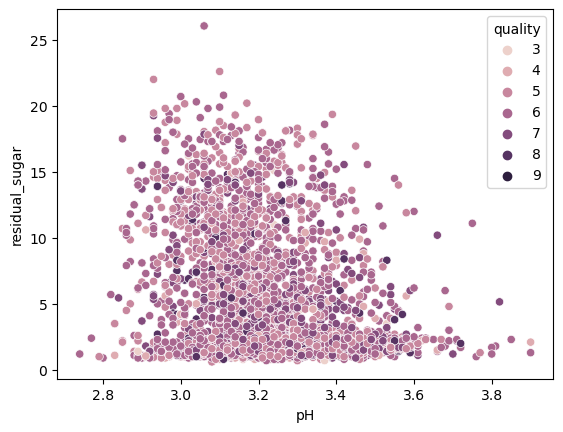

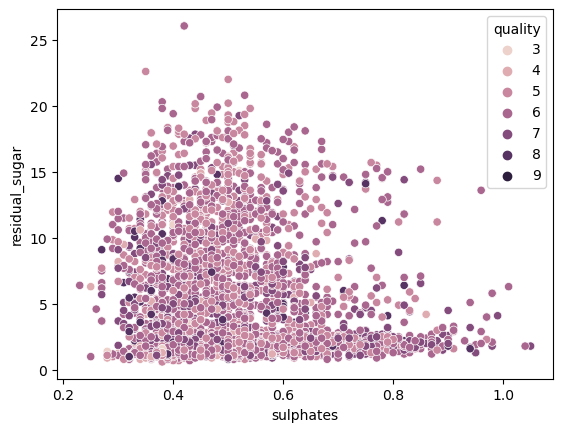

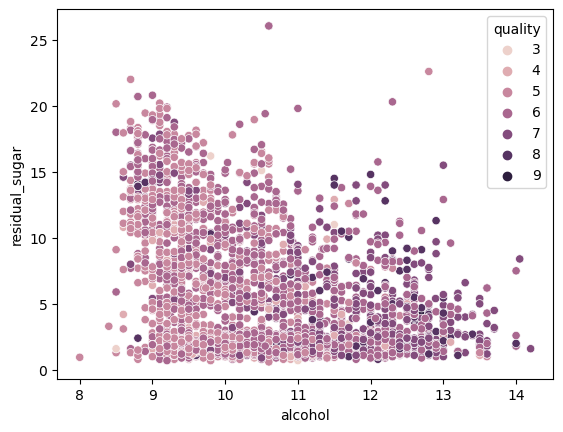

In [19]:
# residual sugar
for col in num_cols:
    sns.scatterplot(x = col, y = 'residual_sugar', data = train, hue = target)
    plt.show()

# Lets make some bins: 
Could be clusters for:
- Alchohol and Sulphates
- Alcohol and pH
- Residual sugar and alcohol

# Questions: 

In [39]:
# imports
from scipy import stats

# 1. Are the means similiar between qulaity and red and white wine color?
- Quality is continous.
- Wine color is categorical.

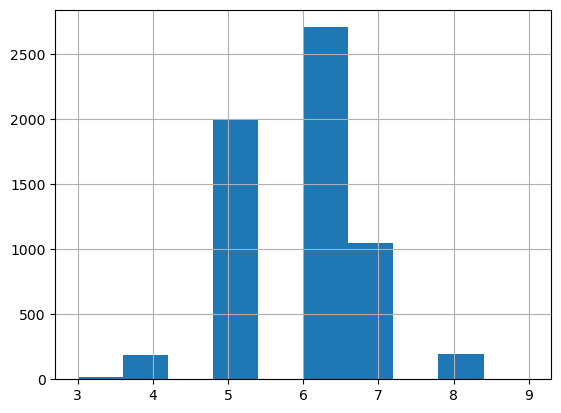

In [41]:
# is quality normally distributed? 
df['quality'].hist()
plt.show()

In [43]:
def eval_dist(r, p, α=0.05):
    """
    This function will take in:
    - r: the test statistic
    - p: p-value
    - α: id defaulted to 5%
    and print out if the data used to create r & p from the stats.shapiro test is normally distributed.
    """
    if p > α:
        return print(f"""The data is normally distributed""")
    else:
        return print(f"""The data is NOT normally distributed""")

In [44]:
# shapiro test
r, p = stats.shapiro(train.quality)
r, p
eval_dist(r, p)

The data is NOT normally distributed


$H_0$: There is no difference in the mean quality of red vs white wine color <br>
$H_a$: There is a difference in the mean quality of red vs white wine color <br>

In [51]:
# have to do a Mann_Whitney test: 
red = train[train.wine_color == 'red'].quality
white = train[train.wine_color == 'white'].quality

stat, p_val = stats.mannwhitneyu(red, white)
if p_val < 0.05:
    print('We can reject the null hypothesis; the means are different.')
else:
    print('We cannot reject the null hypothesis')

We can reject the null hypothesis; the means are different.


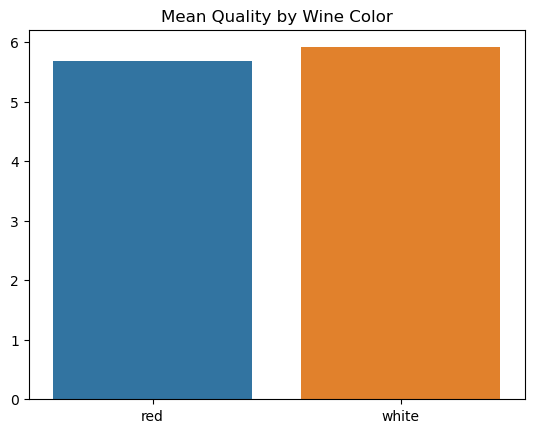

In [60]:
red_mean = train[train.wine_color == 'red'].quality.mean()
white_mean = train[train.wine_color == 'white'].quality.mean()

# Create a bar graph with means
sns.barplot(x=['red', 'white'], y=[red_mean, white_mean])
plt.title('Mean Quality by Wine Color')
plt.show()

1. An important feature to look at is wine color

# 2. Is there a differnece between quality for alcohol? 

<Axes: xlabel='alcohol', ylabel='quality'>

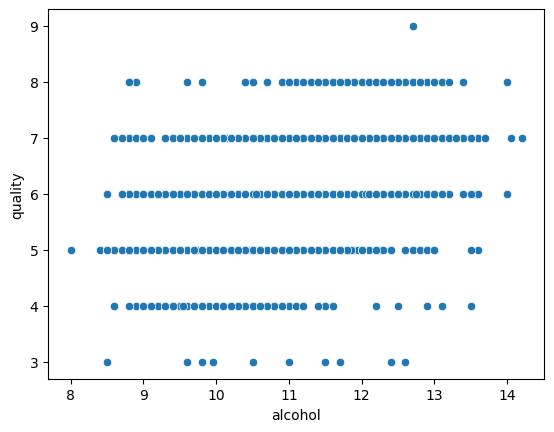

In [71]:
sns.scatterplot(data = train, x = 'alcohol', y = 'quality')

In [74]:
# continous vs continous: Data is not normal: 
def eval_Spearmanresult(r,p,α=0.05):
    """
    
    """
    if p < α:
        return print(f"""We reject H₀, there appears to be a monotonic relationship.
Spearman's rs: {r:2f}.
P-value: {p}""")
    else:
        return print(f"""We fail to reject H₀: that there does not appear to be a monotonic relationship.
Spearman’s r: {r:2f}
P-value: {p}""")

In [76]:
r, p = stats.spearmanr(train['alcohol'], train.quality)
eval_Spearmanresult(r,p)

We reject H₀, there appears to be a monotonic relationship.
Spearman's rs: 0.438994.
P-value: 1.9826706494849643e-162


3. If we control alcohol, does qulaity mean differ for alchohol over 11 percent?

In [67]:
train['alcohol_bins'] = pd.cut(train.alcohol,[0,11,15], labels=['under_11', 'over_11'])

In [68]:
train['alcohol_bins']

621     under_11
3092     over_11
5926    under_11
661     under_11
1140    under_11
          ...   
5721    under_11
1015     over_11
1391    under_11
4933     over_11
4432     over_11
Name: alcohol_bins, Length: 3448, dtype: category
Categories (2, object): ['under_11' < 'over_11']

<Axes: xlabel='alcohol_bins', ylabel='quality'>

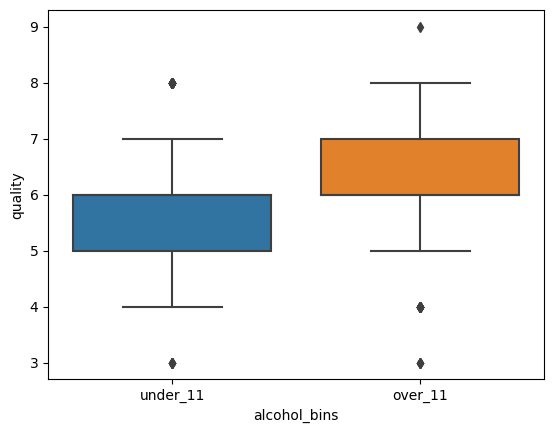

In [70]:
sns.boxplot(data=train, x='alcohol_bins', y='quality')

In [73]:
# the data is not normal: categorical vs continous: Mann-Whitney test: 
under_11 = train[train.alcohol_bins == 'under_11'].quality
over_11 = train[train.alcohol_bins == 'over_11'].quality

stat, p_val = stats.mannwhitneyu(under_11, over_11)
if p_val < 0.05:
    print('We can reject the null hypothesis; the means are different.')
else:
    print('We cannot reject the null hypothesis')

We can reject the null hypothesis; the means are different.


4. Is there a relationship between quality and density

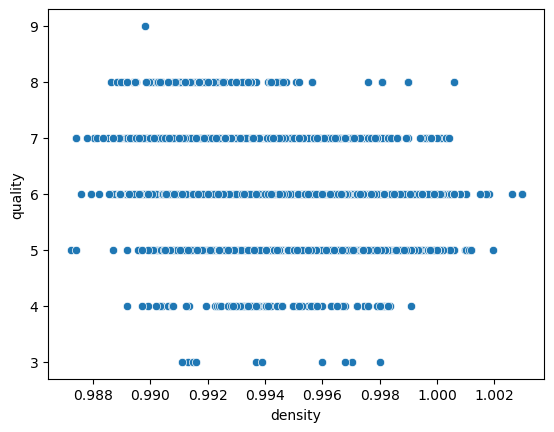

In [95]:
sns.scatterplot(x = 'density', y = 'quality', data = train)
plt.show()

In [ ]:
# continous vs continous: Data is not normal: 
def eval_Spearmanresult(r,p,α=0.05):
    """
    
    """
    if p < α:
        return print(f"""We reject H₀, there appears to be a monotonic relationship.
Spearman's rs: {r:2f}.
P-value: {p}""")
    else:
        return print(f"""We fail to reject H₀: that there does not appear to be a monotonic relationship.
Spearman’s r: {r:2f}
P-value: {p}""")

In [96]:
r, p = stats.spearmanr(train['density'], train.quality)
eval_Spearmanresult(r,p)

We reject H₀, there appears to be a monotonic relationship.
Spearman's rs: -0.328471.
P-value: 1.5278277516688006e-87


# Clustering Features:
- Find clusters to make new features that can be used in modeling

### 1. Is there clustering between sulphates and alcohol?

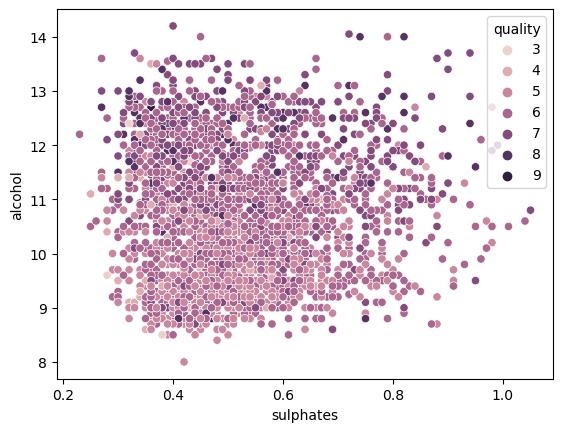

In [79]:
sns.scatterplot(x = 'sulphates', y = 'alcohol', data = train, hue = 'quality')
plt.show()

### 2. Is there clustering between alcohol and residual sugar?

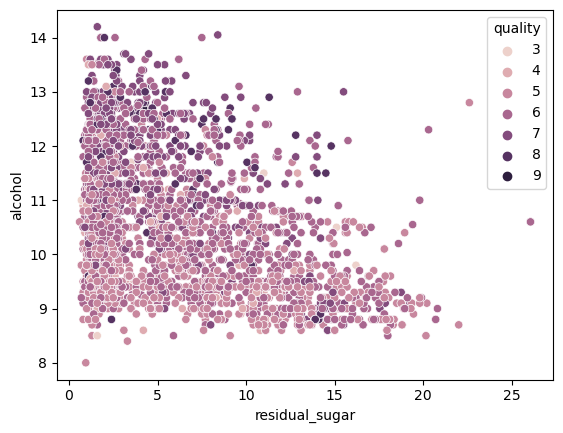

In [82]:
sns.scatterplot(x= 'residual_sugar', y = 'alcohol', data = train, hue = 'quality')
plt.show()

### 3. Is there clustering between alcohol and ph?

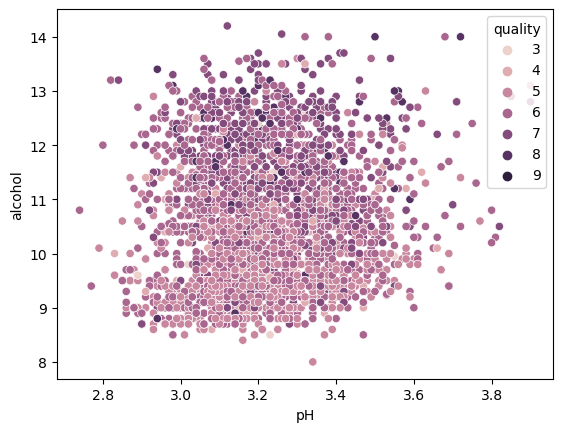

In [83]:
sns.scatterplot(x = 'pH', y = 'alcohol', data = train, hue = 'quality')
plt.show()

### Lets add a third dimenson

In [87]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap

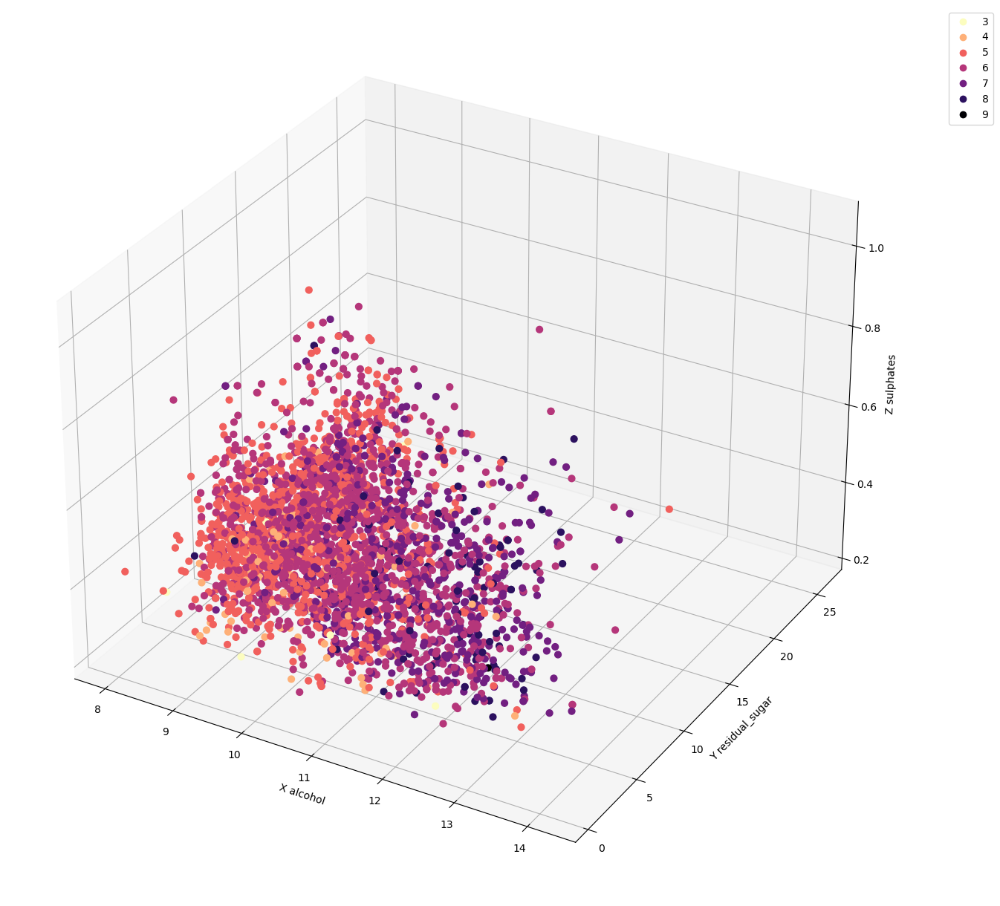

In [98]:
# graph
fig = plt.figure(figsize=(12,12))
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)
cmap = ListedColormap(sns.color_palette("magma_r",256).as_hex())
sc = ax.scatter(train['alcohol'], train['residual_sugar'], train['sulphates'],
                s=40, c=train.quality, marker='o', cmap=cmap, alpha=1)
ax.set_xlabel('X alcohol')
ax.set_ylabel('Y residual_sugar')
ax.set_zlabel('Z sulphates')
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)